In [1]:
from emlib import emlib
import logging
emlib.emlog.setLevel(logging.INFO)

In [2]:
def NPZUS_int(t,initial,dtinput,constants):

    P = initial[0]             # phytoplankton
    Z = initial[1]             # zooplankton
    N = initial[2]             # Nitrogen  
       
    C_P_GROWTH = .5
    C_M_P = .1
    C_NIT = .3
    C_DECOMP = .02
    C_REMIN = .15
    C_Z_GRAZ = .05
    GROWTH_Efficiency = .3
    C_ZOO_MORTALITY = .28
    
    plight = GROWTH_Efficiency
    pnuptake = C_P_GROWTH * N
    zgrazing = C_Z_GRAZ * P
    pmort = C_M_P * P
    zassim = C_Z_GRAZ
    zmort = C_ZOO_MORTALITY * Z
    sedimentation = C_REMIN
    
    P_dot = (plight * pnuptake * abs(P)) - (zgrazing * abs(Z)) - (pmort * abs(P))
    Z_dot = (zassim * zgrazing * abs(Z)) - (zmort * abs(Z))
    N_dot = daily + ((1 - zassim) * zgrazing * abs(Z)) + (pmort * abs(P)) + (zmort * abs(Z)) - (plight * pnuptake * abs(P)) - (sedimentation *N)
    

    return [P_dot,Z_dot,N_dot]

In [3]:
NPZUS = emlib.Model(NPZUS_int) #save the model

INFO -1104- New Model(1): NPZNB_int
INFO -1116- No algorithm supplied assuming vode/bfd O12 Nsteps3000 dt1


In [6]:
zoop_observation = emlib.Observation ("Z", dirname="Data",filename= "US_Zoop.csv")  
chla_observation = emlib.Observation ("P", dirname="Data",filename= "US_Chl.csv")  

NPZUScalibration = emlib.Calibration()  #all of our coefficients
NPZUScalibration.Add("i",val=1.592885, min= 0.01, max= 3.0)#from Turner 2014
NPZUScalibration.Add("Pg",val=2.737052,min= 0.01, max= 3.0)#from Turner 2014
NPZUScalibration.Add("Bg",val=0.837433,min= 0.01, max= 3.0)#from Turner 2014
NPZUScalibration.Add("e",val=1.77639,min= 0.01, max= 2.0)#from Turner 2014
NPZUScalibration.Add("Zm",val=0.028854,min= 0.01, max= 3.0)#from Turner 2014
NPZUScalibration.Add("Pm",val=2.61708,min= 0.01, max= 3.0)#from Turner 2014
NPZUScalibration.Add("Bm",val=1.18918,min= 0.01, max= 1.5)#from Turner 2014
NPZUScalibration.Add("Pe",val=1.24452553,min= 0.01, max= 3.0)#random number
NPZUScalibration.Add("Be",val=0.92205,min= 0.01, max= 1.5)#random number
NPZUScalibration.Add("Pr",val=2.2753,min= 0.01, max= 3.0)#random number
NPZUScalibration.Add("h",val=1.14171,min=0.01,max=3.0)#random moving number
NPZUScalibration.Add("s",val=0.11773830,min= .01, max= 3.0)#from Turner 2014
NPZUScalibration.Add("f",val=0.0570468,min= .01, max= 2.0)#from Turner 2014
NPZUScalibration.initial=[0.5,0.5,0.5,0.5,0.5]

legend = ["B", "P", "Z", "DIN","DON"]   #our graph legend



INFO -879- New TimeSeries instance: 3
INFO -879- New TimeSeries instance: 4
INFO -758- Read file DataUS_MG_Calibrate.csv 21 Observations for value B
INFO -758- Read file DataUS_Zoop.csv 5 Observations for value Z
INFO -758- Read file DataUS_Chl.csv 13 Observations for value P
INFO -352- New Calibration instance: 2


Org. fitness: 42.9 0 0.232 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
inval

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.43333333333333

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.9333333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New.

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.86

New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
Ne

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness

New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New.

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...


New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
inval

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.8

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitn

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 23.1 18.8
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. f

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.86666666666666

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid.

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
i

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 53.8 32.23333333333333
New. fitness: 42.9 0 7.7

New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 52.4 0 38.5 30.3
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
i

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 30.8 27.733333333333334
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 47.6 0 7.7 18.43333333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0

New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.8666666

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334

New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
Ne

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. 

New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 4

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 38.5 28.7
New. 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitn

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.

New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 38.5 30.3
New. fitness: 47.6 0 7.7 18.433333333333334


New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 2

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0

New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4

New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fi

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...


New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 38.5 30.3
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
inv

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
inval

New. fitness: 42.9 0 0 14.299999999999999
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 15.4 21.0
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.53333333333

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.26666

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fit

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 57.1 0 23.1 26.733333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 53.8 35.4
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
Ne

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 40.0 0 13.3333333333333

New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...

New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 38.5 30.3
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitne

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667


New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness:

New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. f

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fi

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitn

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 38.1 0 38.5 25.53333333333333
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
inval

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.8333333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
Ne

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitne

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New.

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
inval

New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 47.6 0 53.8 33.800000000000004
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
N

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 52.4 0 53.8 35.4
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42

New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid.

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 38.5 28.7
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.9333333

New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.43

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid

New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid..

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. f

New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 53.8 35.4
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334


New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New.

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitn

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness:

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
i

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4

New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 30.8 22.966

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6

New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 19.0 0 0 6.3333333333

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
inval

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitn

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 2

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 53.8 35.4
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.93333333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 47.6 0 15.4 21.0
New. fitness:

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitnes

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
N

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness:

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitnes

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitn

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitnes

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.93333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.86666

New. fitness: 33.3 0 23.1 18.8
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitnes

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 46.2 29.7
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
in

New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
in

New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 38.5 30.3
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 52.4 0 30.8 27.733333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 38.5 28.7
New

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 7.7 15.2666666666666

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitnes

New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 9.5 0 0 3.1666666666666665
inva

New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.93

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness:

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 30.8 27.733333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 1

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New.

New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
inval

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 

New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 15.4 16.2333333

New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 57.1 0 7.7 21.599999999999998
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.4333

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitne

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.93333333333333

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
in

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitn

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 57.1 0 7.7 21.599999999999998
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
N

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.93333

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitn

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 52.4 0 38.5 30.3
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
Ne

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness:

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 14.3 0 0 4.7666666666

New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitne

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.93333333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667


New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 15.4 17.

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.53333333333333

New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invali

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.9333

New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New.

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitnes

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fi

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 57.1 0 15.4 24.166666666666668
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. f

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 23.1 18.8
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
in

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitne

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. f

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 1

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 1

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fi

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 53.8 35.4
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 23.1 18.8
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitnes

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.59999

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New.

New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invali

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
inv

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. 

New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.93333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 3

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 57.1 0 7.7 21.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.43333333333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 23.1 18.8
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fi

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitne

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid.

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 38.5 30.3
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitnes

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.9333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.9333333333333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.53333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fi

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 33.3 0 23.1 18.8
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.93333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 23.1 18.8
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4

New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 52.4 0 38.5 30.3
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 57.1 0 7.7 21.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.9

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
i

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0


New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
inval

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.

New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
Ne

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitne

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 46.2 29.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 38.5 30.3
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 1

New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.93333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
Ne

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
inval

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.9333333

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334


New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.9

New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 23.1 18.8
New

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 53.8 35.4
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.13333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000

New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
N

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 38.1 0 7.7 15.266666666666667
New. fit

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid.

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
in

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 23.1 18.8
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
N

New. fitness: 47.6 0 15.4 21.0
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fi

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 

New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.9333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 0 14.299999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. 

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
in

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 38.5 28.7
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 9.5 0 0 3.1

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fit

New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 15.4 14.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
N

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.43

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid.

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 0 14.299999999999999
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fi

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitnes

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 38.5 30.3
New. fitness: 52.4 0 30.8 27.733333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.5333333

New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 38.5 30.3
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitn

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 53.8 35.4
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.86666666666666

New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 15.4

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 47.6 0 7.7 1

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...


New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitne

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.43333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 23.1 20.400000000000002
New. f

New. fitness: 52.4 0 30.8 27.733333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.93333333333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitnes

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid..

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fi

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. 

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 57.1 0 23.1 26.733333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitn

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 30.8 27.733333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
N

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fi

New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid..

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. f

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 15.4 19

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. f

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fit

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 23.1 23.5666

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.26666666

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 23.1 23.566

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
in

New. fitness: 47.6 0 38.5 28.7
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New.

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.53333333333

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.53333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness:

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitnes

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.86666666

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
Ne

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
inva

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
i

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitn

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitne

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. f

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness:

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitnes

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
inva

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid.

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
N

New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 53.8 33.800000000000004
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 23.1 18.8
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 4.8 0 0 1.5

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.5333

New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.86666

New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 38.5 28.7
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.93333

New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invali

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 57.1 0 23.1 26.733333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
Ne

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitn

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 23.8 0 0 7.933333333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New.

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 0 0 0

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.93333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.9333333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.5333333333

New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.4333333333

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 0 1

New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.9

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.10

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.76

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.8333

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 52.4 0 38.5 30.3
New. 

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.5

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 0 12.700000000000001
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667

New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitn

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.4333333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness:

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitnes

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 30.8 27.733333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.43333333333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0

New. fitness: 28.6 0 15.4 14.666666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. f

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 0 12.700000000000001
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. 

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fi

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fi

New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 15.4 14.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.8666666666

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 53.8 35.4
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.1000000000

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.93333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 38.5 30.3
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 15.4 19.433333333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 1

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.43333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 23.1 22.0
New

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333


New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
Ne

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
i

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 57.1 0 7.7 21.599999999999998
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 23.8 0 0 7.93333333

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 53.8 35.4
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 30.8 27.733333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...

New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0

New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...


New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000

New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New.

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 53.8 35.4
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid.

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 15.4 14.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. 

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 0 14.299999999999999
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 38.5 28.7
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fit

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.5333333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness:

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 53.8 33.800000000000004
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 38.5 28.7
New. fitness: 47.6 0 53.8 33.800000000000004
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New.

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fi

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 38.5 30.3
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
N

New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0

New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. 

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness:

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 

New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 23.1 18.8
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 

New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.66666666

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.93

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.5333333333

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.53333333

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 15.4 21

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
in

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
Ne

New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitnes

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.6

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New.

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 38.5 30.3
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.93333333333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 30.8 2

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness:

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness

New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 15.4 14.666666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 2

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.9333

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.26666666

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. 

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New.

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.9333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 53.8 35.4
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 7.7 10.5
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 23.1 18.8

New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.9333333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 0 14.299999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invali

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
N

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.5

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
N

New. fitness: 23.8 0 7.7 10.5
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 38.5 27.133333333333336
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 23.1 18.8
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitnes

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 57.1 0 7.7 21.599999999999998
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness:

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 7.7 10.5
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.8

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 7.7 13.666666666666666
New.

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.93333333333

New. fitness: 47.6 0 38.5 28.7
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1

New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitne

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.5

New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 19.0 0 0 6.3333

New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
N

New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 47.6 0 38.5 28.7
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.6666666666

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New.

New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitnes

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336


New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.93333333333333

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
N

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 2

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
inva

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 38.5 28.7
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 38.1 0 15.4

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 7.7 12.10

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...


New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitne

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 23.1 22.0
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 33.3 0 23.1 18.8
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fit

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 7.7 10.5
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New.

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 42.9 0 23.1 22.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitn

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 

New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 15.4 21.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 23.1 17.233333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
Ne

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 19.0 0 7.7 8.9
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 46.2 32.86666666666667
New. fi

New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 52.4 0 7.7 20.033333333333335
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.53333333333

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitn

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.4

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 23.1 18.8
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.5333333333

New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 2

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fit

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333

New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 15.4 16.23333333333333
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness:

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 38.5 28.7
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness:

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitne

New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. f

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 15.4 21.0
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 23.1 22.0
New. fitness: 38.1 0 15.4 17.833333333333332
New. fi

New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 52.4 0 38.5 30.3
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
in

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 9.5 0 0 3.1666666

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 30.8 21.366666666666664
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 47.6 0 46.2 31.26666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 40.0 0 13.333333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 0 11.1
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 47.6 0 15.4 21.0
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15.26666

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness:

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.2666666

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
inva

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 57.1 0 7.7 21.599999999999998
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 15.4 17.833333333333332
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 57.1 0 7.7 21.599999999999998
New. fi

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 33.3 0 23.1 18.8
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
inval

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.33

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 38.1 0 7.7 15

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 38.5 28.7
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. 

New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 23.1 25.166666666666668
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 15.4 21.0
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 7.7 10.5
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 7.7 10.5
New. fitness: 28.

New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid..

New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 52.4 0 46.2 32.866666666666

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15

New. fitness: 52.4 0 46.2 32.86666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 23.1 20.400000000000002
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 15.4 19.433333333333334
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 23.8 0 7.7 10.5
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 0 20.0 0 6.666666666666667
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 15.4 21.0
New. fitness: 28.6 0 0 9.533333333333333
inv

New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 42.9 0 30.8 24.566666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 42.9 0 7.7 16.866666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 28.6 0 0 9.533333333

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 30.8 22.96666666666667
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 47.6 0 23.1 23.566666666666666
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 4.8 0 0 1.5999999999999999
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0

New. fitness: 47.6 0 7.7 18.433333333333334
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 47.6 0 30.8 26.133333333333336
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 52.4 0 15.4 22.599999999999998
New. fitness: 47.6 0 53.8 33.800000000000004
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 9.5 0 0 3.1666666666666665
invalid...
New. fitness: 42.9 0 23.1 22.0
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 33.3 0 23.1 18.8
New. fitness: 33.3 0 7.7 13.666666666666666
New. fitness: 14.3 0 0 4.766666666666667
invalid...
New. fitness: 47.6 0 30.8 2

New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 19.0 0 0 6.333333333333333
invalid...
New. fitness: 28.6 0 7.7 12.100000000000001
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 23.8 0 0 7.933333333333334
invalid...
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 38.1 0 7.7 15.266666666666667
New. fitness: 0 0 0 0.0
invalid...
New. fitness: 28.6 0 0 9.533333333333333
invalid...
New. fitness: 0 0 0 0.0
invalid...


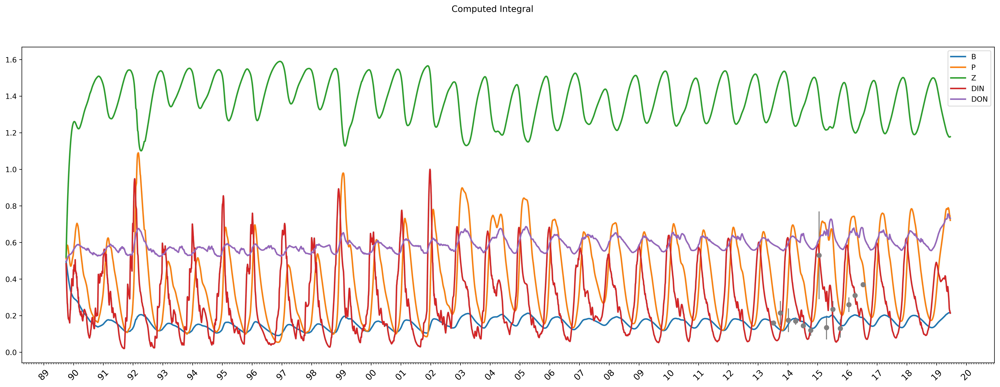

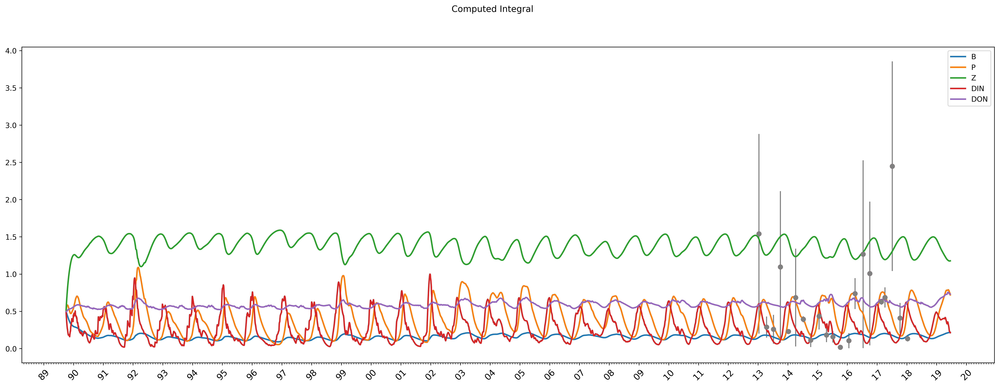

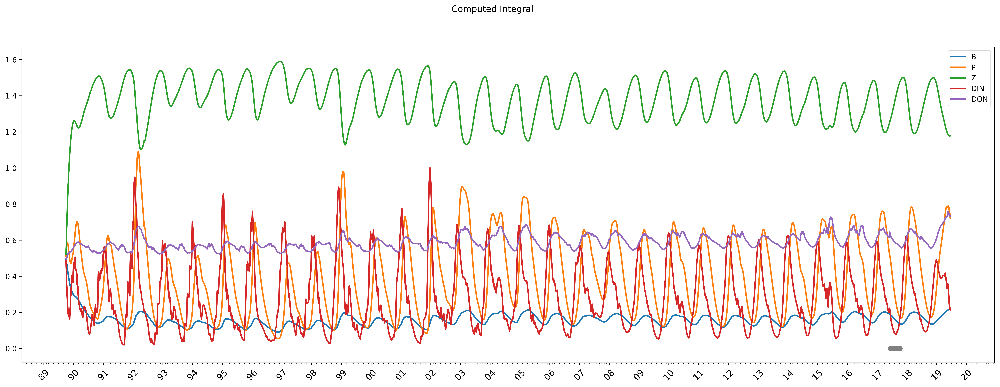

GFMODEL #5 Xtot:0.0 RMSD:0.0 RMSE:0.162 RANGE%0 MSER:0.4 WMSE:0.4
Label	Value	Min	Max	ISConst	Desc
i 	 2.800367951669186 	 0.01 	 3.0 	 False 	 None
Pg 	 2.447680956608964 	 0.01 	 3.0 	 False 	 None
Bg 	 1.9414153596966588 	 0.01 	 3.0 	 False 	 None
e 	 1.8446585090785765 	 0.01 	 2.0 	 False 	 None
Zm 	 0.9896595090370436 	 0.01 	 3.0 	 False 	 None
Pm 	 2.81722655152204 	 0.01 	 3.0 	 False 	 None
Bm 	 1.1529542303403755 	 0.01 	 1.5 	 False 	 None
Pe 	 0.49685475027073545 	 0.01 	 3.0 	 False 	 None
Be 	 0.9271785703168129 	 0.01 	 1.5 	 False 	 None
Pr 	 2.8099822766770752 	 0.01 	 3.0 	 False 	 None
h 	 1.43299734938671 	 0.01 	 3.0 	 False 	 None
s 	 2.59281533655198 	 0.01 	 3.0 	 False 	 None
f 	 0.9796924370324028 	 0.01 	 2.0 	 False 	 None


In [7]:
import copy
runs = 100000

NPZUS.Integrate(NPZUScalibration.initial, Calibration=NPZUScalibration,TimeSeries= nutrients_alltime, dt=0.01) 
GF_benthos = NPZUS.Validate(benthos_observation)
GF_zoop = NPZUS.Validate(zoop_observation)
GF_chla = NPZUS.Validate(chla_observation)
avg_MSE = ( GF_benthos.MSE + GF_zoop.MSE + GF_chla.MSE)/ 3
avg_RANGE = (GF_benthos.RANGE + GF_zoop.RANGE + GF_chla.RANGE) / 3

best = None
print ("Org. fitness:", GF_benthos.RANGE, GF_zoop.RANGE, GF_chla.MSE, avg_RANGE)

for i in range(runs):
    testingC = copy.deepcopy(NPZUScalibration)
    testingC.Randomize()
    NPZUS.Integrate(NPZUScalibration.initial, Calibration=testingC,TimeSeries= nutrients_alltime, dt=0.01) 
    GF_benthos_new = NPZUS.Validate(benthos_observation)
    GF_zoop_new = NPZUS.Validate(zoop_observation)
    GF_chla_new = NPZUS.Validate(chla_observation)
    avgRANGE_new = (GF_benthos_new.RANGE + GF_zoop_new.RANGE + GF_chla_new.RANGE) / 3
    avgMSE_new = (GF_benthos_new.MSE + GF_zoop_new.MSE + GF_chla_new.MSE) / 3
    print ("New. fitness:", GF_benthos_new.RANGE, GF_zoop_new.RANGE, GF_chla_new.RANGE, avgRANGE_new)
    
    if (GF_benthos_new.MSE  is 0) or (GF_zoop_new.MSE  is 0) or (GF_chla_new.MSE  is 0):
        print ("invalid...")
        continue
    if (GF_benthos_new.RANGE  is 0)  or (GF_chla_new.RANGE  is 0):  # zoop count it so small we cant strip by range =0
        print ("invalid...")
        continue
        
        
    if (avgRANGE_new >= avg_RANGE) and (avgMSE_new <= avg_MSE):
        best = testingC
        print("New Best Calibration:")
        best.Print()
        avg_RANGE = avgRANGE_new
        avg_MSE = avgMSE_new

if best:  #if we found a best calibration lets print it out
    NPZUS.Integrate(NPZUScalibration.initial, Calibration=best,TimeSeries= nutrients_alltime, dt=0.01)
    NPZUS.Validate(chla_observation, graph =True, legend=legend) 
    NPZUS.Validate(benthos_observation, graph =True, legend=legend) 
    NPZUS.Validate(zoop_observation, graph =True, legend=legend) 
    NPZUS.fit.Print()
    best.Print()
    